### Zadania

Celem zadań jest napisanie (fragmentów) programów, które wyodrębnią obiekty znajdujące się na podanych obrazach. Rozumie się przez to doprowadzenie obrazów do postaci binarnej z wyraźną separacją między obiektami a tłem oraz poszczególnymi obiektami.

Samo osiągnięcie "jakiegoś" wyniku (`cv2.threshold` odpalone, próg wybrany "z palca", _coś tam_ widać, wynik wyświetlony) to co najwyżej połowa sukcesu (i oceny). Ważne jest pokazanie w drodze eksperymentu odpowiedzi na pytania - czy te podane w treści zadania, czy takie, które się Tobie nasunęły.

In [67]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

##### Zad. 1: Monety szare

Dane są dwa czarno-białe obrazy monet, `monety_szare` oraz `monety_szare_szum`, z których drugi zawiera pewien poziom zakłóceń. Dokonaj binaryzacji tych obrazów za pomocą progowania. W jaki sposób ustalisz wartość progu? Jaki wpływ mają zakłócenia w drugim obrazie? Jak się ich pozbędziesz?

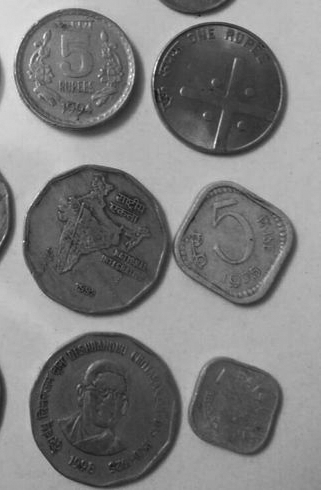

In [23]:
# 1A
monety_szare = cv2.imread('../dane-1-4/Monety_szare.bmp')
Image.fromarray(cv2.cvtColor(monety_szare, cv2.COLOR_BGR2RGB))

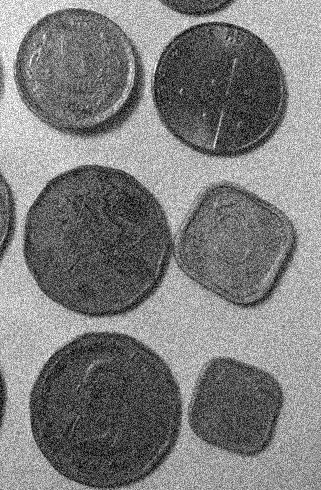

In [24]:
# 1B
monety_szare_szum = cv2.imread('../dane-1-4/Monety_szare_szum.bmp')
Image.fromarray(cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2RGB))

Rozwiązanie części 1A:

a) Ręczne ustawienie progu na podstawie histogramu wartości na skali szarości

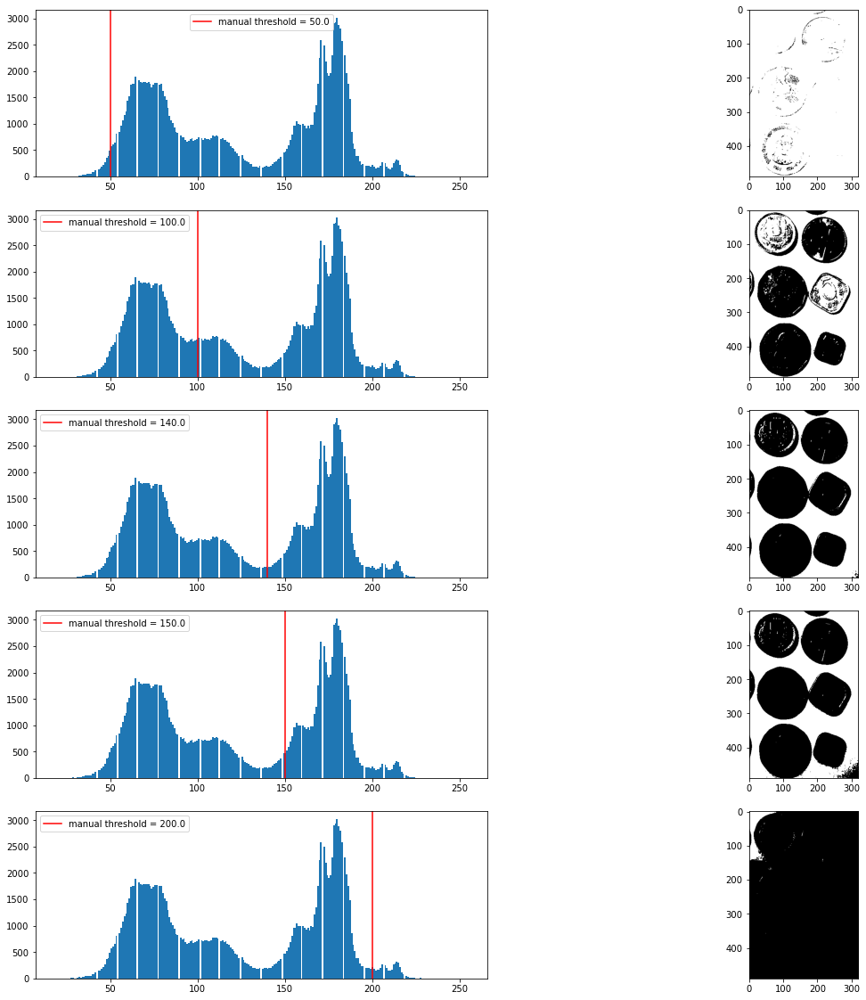

In [101]:
# Najlepszy threshold na podstawie histogramu - granica pomiędzy peakami

def manual_threshold(image, threshold):
    threshold, img_thresh = cv2.threshold(image, threshold, 255, cv2.THRESH_BINARY)

    return image, threshold, img_thresh

def plot_manual(data):
    fig, axes = plt.subplots(5, 2, figsize=(20, 20))

    for ax, (image, threshold, thresh_image) in zip(axes, data):
        ax[0].hist(image.flatten(), bins=255)
        ax[0].axvline(x=threshold, color='r', label=f'manual threshold = {threshold}')
        ax[0].legend()

        ax[1].imshow(thresh_image, cmap="gray")

    plt.show()

img_Gray = cv2.cvtColor(monety_szare, cv2.COLOR_BGR2GRAY)
data = [manual_threshold(img_Gray, threshold) for threshold in [50, 100, 140, 150, 200]]
plot_manual(data)

b) Automatyczne ustawienie progu na podstawie histogramu wartości na skali szarości przy użyciu otsu. 

Otsu wybiera threshold w taki sposób aby minimalizować sumę wariancji komponent w bimodalnej dystrybucji

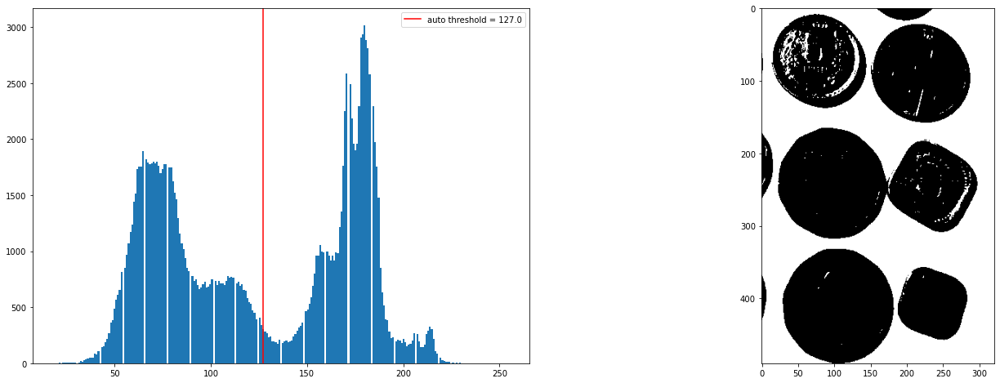

In [41]:
img_Gray = cv2.cvtColor(monety_szare, cv2.COLOR_BGR2GRAY)
threshold, img_thresh = cv2.threshold(img_Gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

fig, ax = plt.subplots(1, 2, figsize=(24, 8))

ax[0].hist(img_Gray.flatten(), bins=255)
ax[0].axvline(x=threshold, color='r', label=f'auto threshold = {threshold}')
ax[1].imshow(img_thresh, cmap="gray")

ax[0].legend()
plt.show()

Rozwiązanie części 1B:


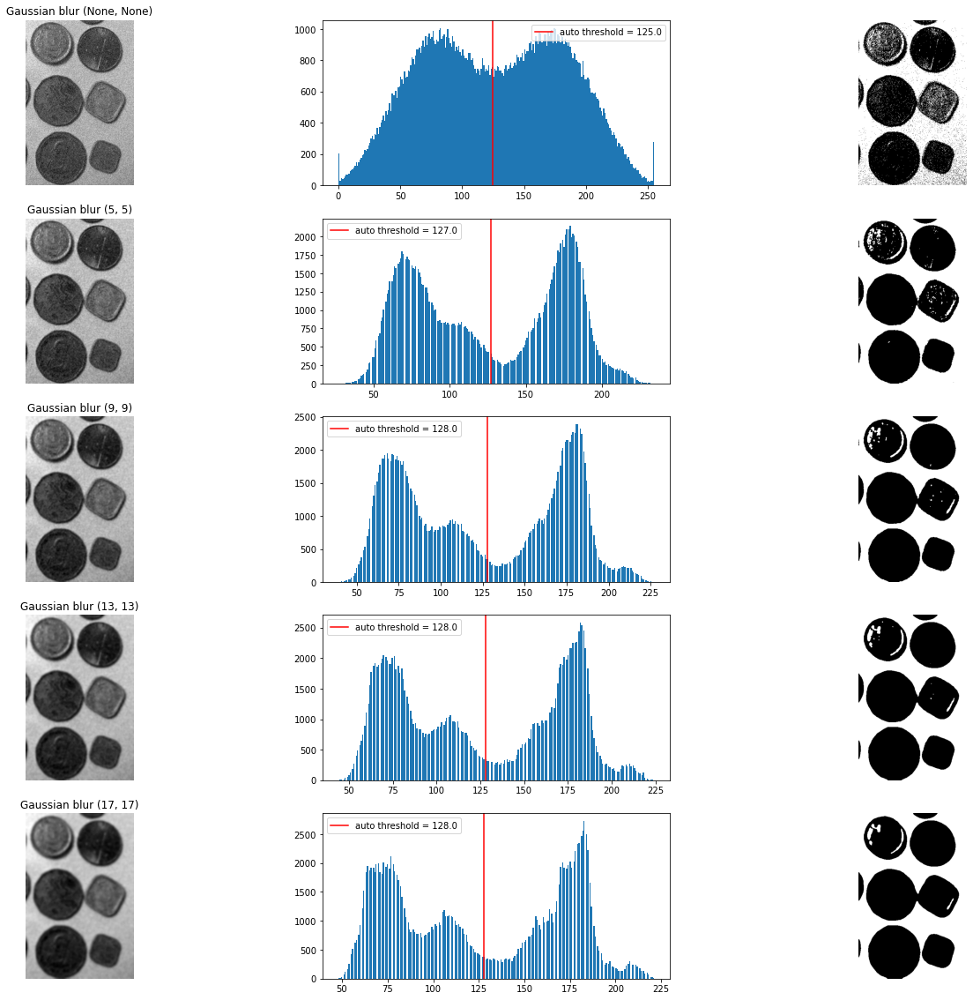

In [85]:
# Odszumianie przy użyciu filtrów Gaussa + Otsu

def generate_gaussian_otsu(image, size):
    if size:
        denoise = imagedenoise = cv2.GaussianBlur(image, (size, size), 0)
    else:
        denoise = image
    
    threshold, img_thresh = cv2.threshold(denoise, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    return denoise, threshold, img_thresh

def plot_gaussian_otsu(data):
    fig, axes = plt.subplots(5, 3, figsize=(24, 20))

    for ax, (kernel_size, denoise, threshold, image) in zip(axes, data):
        
        ax[0].imshow(denoise, cmap="gray")
        ax[0].set_title(f"Gaussian blur ({kernel_size}, {kernel_size})")
        ax[0].axis("off")
        
        ax[1].hist(denoise.flatten(), bins=255)
        ax[1].axvline(x=threshold, color='r', label=f'auto threshold = {threshold}')
        ax[1].legend()

        ax[2].imshow(image, cmap="gray")
        ax[2].axis("off")

    plt.show()

img_Gray = cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2GRAY)
data = [(kernel_size, *generate_gaussian_otsu(img_Gray, kernel_size)) for kernel_size in [None, 5, 9, 13, 17]]
plot_gaussian_otsu(data)

##### Zad. 2: Monety kolorowe

Na podobnej zasadzie dokonaj binaryzacji poniższych obrazów kolorowych. Skorzystaj z modelu barw HSV. Posłuż się kształtem histogramu dla wybranej składowej.

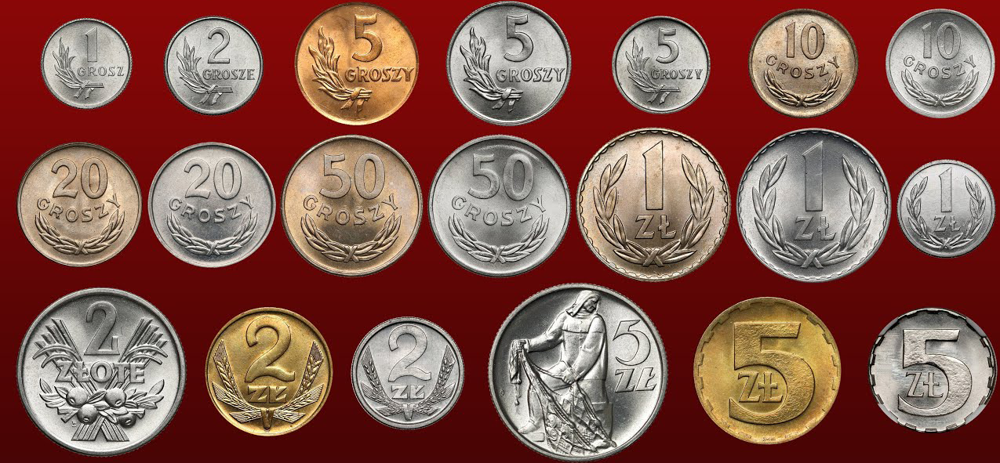

In [7]:
# 2A
monety_kolor = cv2.imread('../dane-1-4/Monety_kolor.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2RGB))

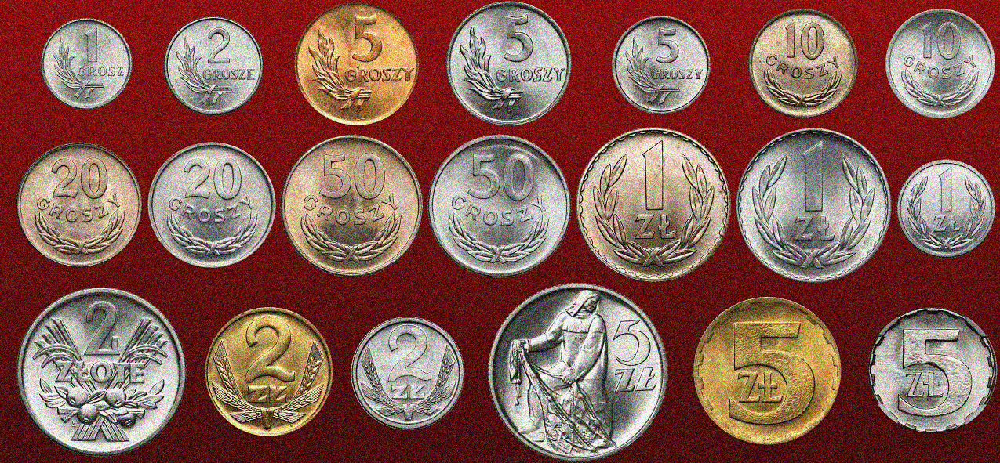

In [8]:
# 2B
monety_kolor_szum = cv2.imread('../dane-1-4/Monety_kolor_szum.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2RGB))

Rozwiązanie części 2A:

Thresholding otsu na podstawie histogramów różnych kanałów HSV
* H - barwa, barwy podstawowe + wtórne
* S - nasycenie, wielokrotne dodawanie H do V, sprawia, że barwa jest coraz bardziej intensywna
* V - jasność, od białego do czarnego dodawana do koloru

Najlepsze efekty widzimy dla kanału S, monety mają większą intensywność od tła.  
Zauważamy też, że metoda otsu nie zawsze jest najlepszym wyborem.

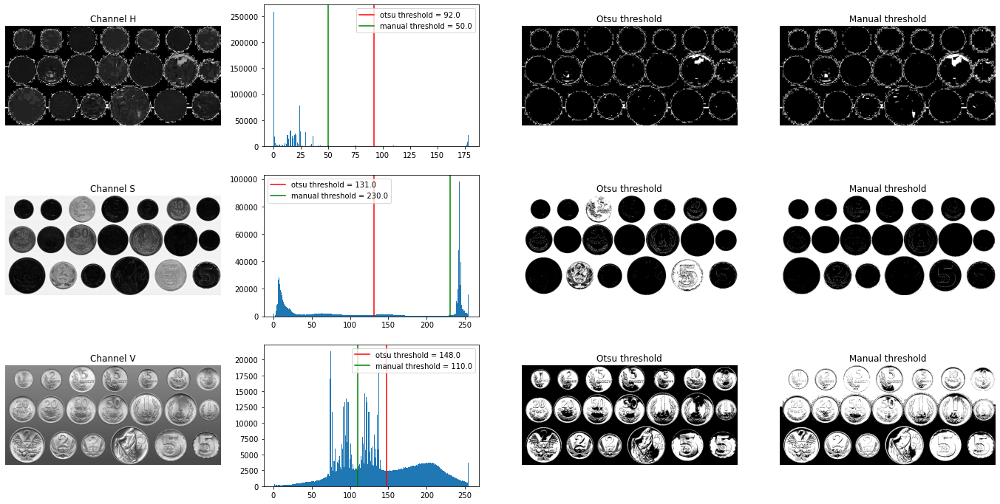

In [90]:
def threshold_channel_otsu(image, channel, manual_threshold):
    channel_image = image[..., channel]
    
    auto_threshold, img_auto_thresh = cv2.threshold(channel_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    manual_threshold, img_manual_thresh = cv2.threshold(channel_image, manual_threshold, 255, cv2.THRESH_BINARY)

    return channel_image, auto_threshold, img_auto_thresh, manual_threshold, img_manual_thresh

def plot_hsv(data):
    fig, axes = plt.subplots(3, 4, figsize=(24, 12))

    for ax, (channel, channel_image, auto_threshold, img_auto_thresh, manual_threshold, img_manual_thresh) in zip(axes, data):
        
        ax[0].imshow(channel_image, cmap="gray")
        ax[0].set_title(f"Channel {channel}")
        ax[0].axis("off")

        ax[1].hist(channel_image.flatten(), bins=255)
        ax[1].axvline(x=auto_threshold, color='r', label=f'otsu threshold = {auto_threshold}')
        ax[1].axvline(x=manual_threshold, color='g', label=f'manual threshold = {manual_threshold}')
        ax[1].legend()

        ax[2].imshow(img_auto_thresh, cmap="gray")
        ax[2].set_title("Otsu threshold")
        ax[2].axis("off")

        ax[3].imshow(img_manual_thresh, cmap="gray")
        ax[3].set_title("Manual threshold")
        ax[3].axis("off")

    plt.show()

monety_hsv = cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2HSV)
data = [
    (channel_name, *threshold_channel_otsu(monety_hsv, channel, manual_threshold))
    for channel_name, channel, manual_threshold in [("H", 0, 50), ("S", 1, 230), ("V", 2, 110)]
]
plot_hsv(data)

Rozwiązanie części 2B:


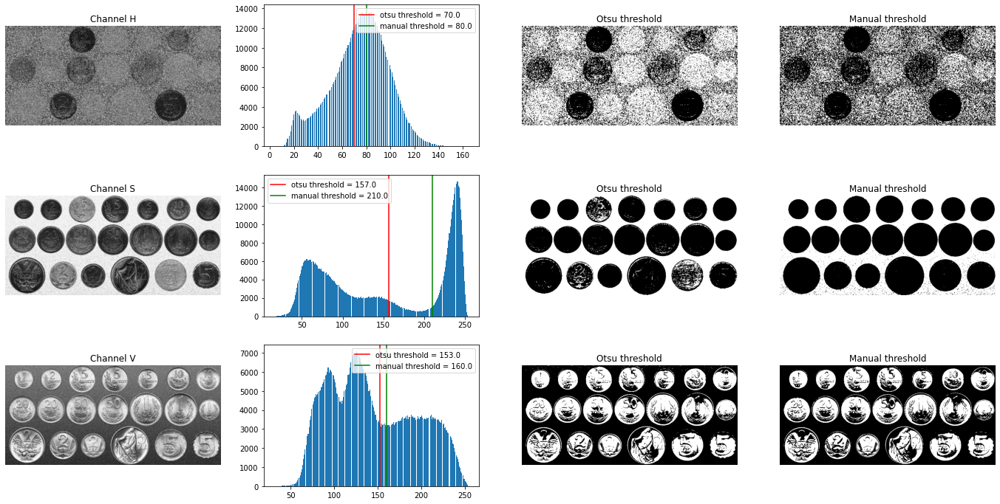

In [94]:
# Thresholding otsu na podstawie histogramów różnych kanałów HSV wraz z gaussian blurem
def threshold_channel_otsu_blur(image, channel, kernel_size, manual_threshold):
    channel_image = image[..., channel]
    denoise = cv2.GaussianBlur(channel_image, (kernel_size, kernel_size), 0)
    
    auto_threshold, img_auto_thresh = cv2.threshold(denoise, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    manual_threshold, img_manual_thresh = cv2.threshold(denoise, manual_threshold, 255, cv2.THRESH_BINARY)

    return denoise, auto_threshold, img_auto_thresh, manual_threshold, img_manual_thresh

monety_hsv = cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2HSV)
data = [
    (channel_name, *threshold_channel_otsu_blur(monety_hsv, channel, 5, manual_threshold))
    for channel_name, channel, manual_threshold in [("H", 0, 80), ("S", 1, 210), ("V", 2, 160)]
]
plot_hsv(data)

##### Zad. 3: Tekst

W tym przypadku należy wyodrębnić litery od bardzo nierównomiernie oświetlonego tła. Skorzystaj z binaryzacji metodą Otsu. Zastosuj binaryzację w sposób lokalny (oknem przesuwnym). Jaki wpływ ma rozmiar okna na jakość binaryzacji? Jak przesuwać okno?

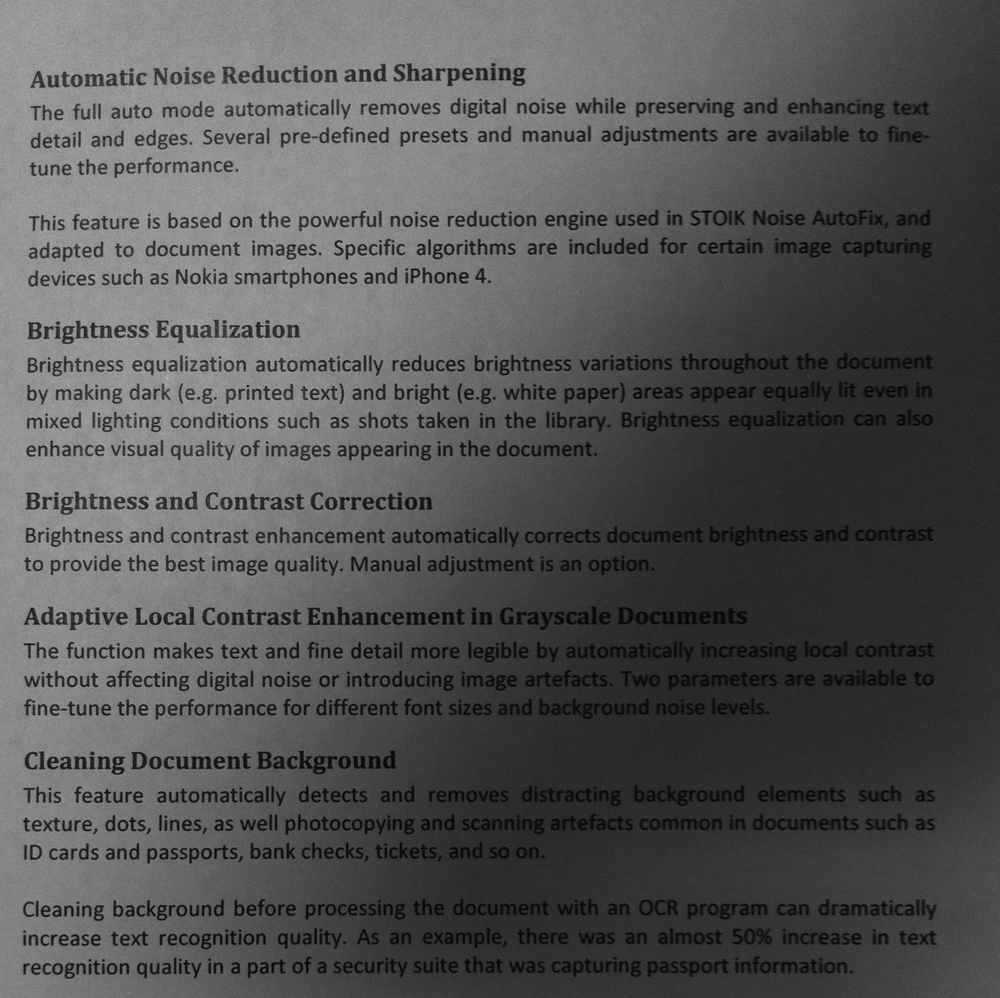

In [11]:
tekst = cv2.imread('../dane-1-4/Tekst1.bmp')
Image.fromarray(cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY))

Rozwiązanie:

Przy małych kernelach tło wokół tekstu jest mocno zaszumione, ale dopóki kernel jest większy od liter, to wyniki binaryzacji są dosyć dobre.
Dla średnich kerneli tło wokół liter jest dużo czystsze i litery są bardzo dobrze widoczne, jednak wraz ze wzrostem wielkości kernela, obszary o większym przyciemnieniu zaczynają być gorszej jakości.
Dla dużych kerneli widzimy kontynuacje trendu - dopóki w ramach okna jest podobne zaciemnienie obrazu do progowanie działa, jednak gdy tło jest mocno nieregularne metoda nie działa.

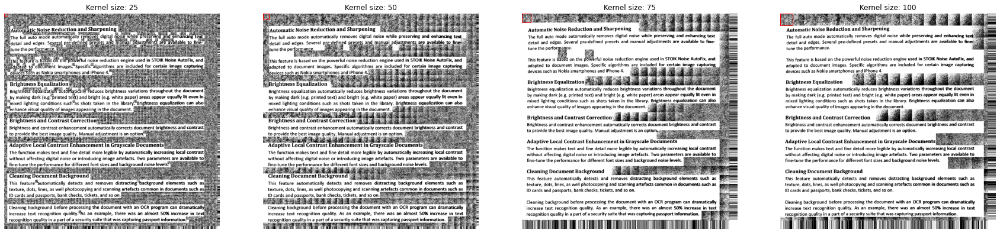

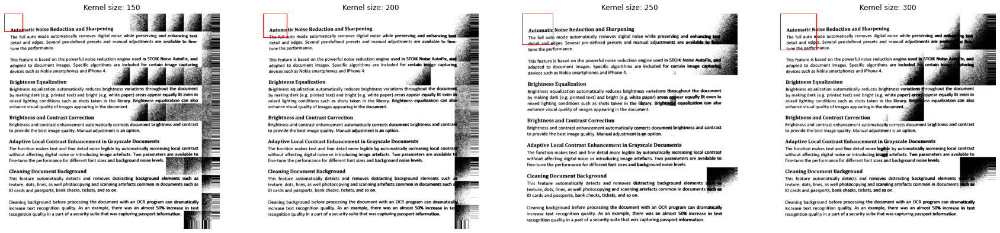

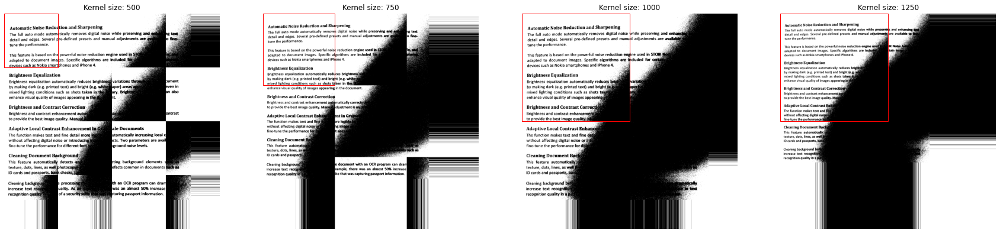

In [73]:
def local_otsu(image, kernel_size):
    H, W = image.shape

    h_pad = kernel_size - (H % kernel_size)
    w_pad = kernel_size - (W % kernel_size)
    
    pad_image = cv2.copyMakeBorder(image, 0, h_pad, 0, w_pad, cv2.BORDER_REPLICATE)
    pad_H, pad_W = pad_image.shape

    for h in range(0, pad_H, kernel_size):
        for w in range(0, pad_W, kernel_size):
            patch = pad_image[h : h + kernel_size, w : w + kernel_size]
            _, patch_thresh = cv2.threshold(patch, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            pad_image[h : h + kernel_size, w : w + kernel_size] = patch_thresh

    return image, pad_image 

def plot_local_otsu(data):
    fig, axes = plt.subplots(1, 4, figsize=(30, 14))

    for ax, (kernel_size, image, thresh_image) in zip(axes, data):
        ax.imshow(thresh_image, cmap="gray")
        ax.set_title(f"Kernel size: {kernel_size}")
        ax.axis('off')

        rect = patches.Rectangle((0, 0), kernel_size, kernel_size, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

    plt.show()

img_Gray = cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY)

# Smaller kernels
data = [
    (kernel_size, *local_otsu(img_Gray, kernel_size))
    for kernel_size in [25, 50, 75, 100]
]
plot_local_otsu(data)

# Medium kernels
data = [
    (kernel_size, *local_otsu(img_Gray, kernel_size))
    for kernel_size in [150, 200, 250, 300]
]
plot_local_otsu(data)

# Large kernels
data = [
    (kernel_size, *local_otsu(img_Gray, kernel_size))
    for kernel_size in [500, 750, 1000, 1250]
]
plot_local_otsu(data)